In [1]:
# %%bash
# conda info| grep "active environment"

# Bin Packing Examples

* Im putting up this notebook just in case it becomes useful to someone. I looked into bin packing because Im always annoyed at how much blank space appears whenever I look at datasets. 

At first I looked at https://github.com/secnot/rectpack because python is easy to get up and test something. But I found it dreadfully slow. As an example, a 397 image dataset (https://www.kaggle.com/ajayrana/hymenoptera-data#hymenoptera_data.zip) took minutes to compute, too slow.

So I looked into https://github.com/juj/RectangleBinPack, upon which this is mostly based. That promised to be faster and indeed it is, but it is built using boost njam, and I find that cumbersome, also, to store tests I like jupyter, so I added python bindings using pybind11. I only tested this with linux 16 and 18 python 3.6 and 3.7, but with these setups on a virgin conda environment (virtual env or docker should be similar), with gcc and cmake installed in my computer all one has to do is run the install.sh.

I also wrapped the bin packing classes so that all heuristics therein contained can be ran out of one command. The processing time was reduced from minutes to miliseconds. 

* To see how the various algorithms deal with sequential information I did a hue sorting of the images.

* Efficiency is not logged, however I initialized the bins with minimum area that fits all rectangles. The most efficient method is MaxRectsBinPack, heuristic: RectBestAreaFit requires ~ 103% of the sum area of all rectangles. 

* For one method, MaxRectsBinPack, is built with the capability of returning a list of fixed size bins.

#### Caveats and Furthermores
* to use this code in production it ought to be either stripped of the unused methods or properly templated. 

* This notebook also uses a private module I use which isnt ready to see the light of day, yet. However if you do run this notebook without the dataset, it should work after installing the **pybinpack** module. 


* I have not read all the literature, or have thought or read about if there is a closed form bin packing optimal solution. Therefore this is probably improveable. 


* After looking at all these algorithms I see that theres probably many opportunities to improve the packing such as:
    * looking a back into empty spaces, 
    * using some form of multigrid simulation; maybe in 4d to allow intersticial spaces to be packed?
    * I would suspect that shortly -if not yet already- someone will have implementing a deeplearning binpacker that improves efficiency.


xvdp 2018.12


### Necessary included - these should have been all installed by the ./install.sh bash

In [2]:
import sys
import os
import os.path as osp
import time
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

import pybinpack as pb
print('python', sys.version_info[:3])

pb_file = pb.__file__
print('pybinpack', pb.__version__, '\n', pb_file)
age = (time.time() - os.stat(pb_file).st_mtime)
print('\tage: %02d:%02d:%02d'%((age//3600) ,((age//60)%60), age%60))

python (3, 6, 5)
pybinpack 0.0.4 
 /home/z/miniconda3/envs/abg/lib/python3.6/site-packages/pybinpack-0.0.4-py3.6-linux-x86_64.egg/pybinpack.cpython-36m-x86_64-linux-gnu.so
	age: 00:01:36


### Optional include replaced by array in the except

In [3]:
try:
    # if this fails, is that I havent released xun yet, this notebook can works just with filesizes
    import xun
    print('xun', xun.__version__)

    data_root = '/home/z/data/hymenoptera_data'
    #data_split = (-1, 25, 25)
    force = False;#True # set to true to reevaluate the statistics of dataset
    H = xun.dataset.Stats(data_root=data_root, force=force)
    
    sort = 'hue'
    files = H.files_sorted(sort)
    sizelist = H.sizes[H.sorted[sort]]
    print(sizes.tolist())
    
except:
    print("if xun not installed, sizelist suffices, no images will be shown but op still works")
    sizelist = [[332, 500], [500, 333], [333, 500], [375, 500], [353, 500], [333, 500], [333, 500], [500, 333], [333, 500], [500, 441], [334, 500], [359, 479], [333, 500], [500, 375], [333, 500], [432, 500], [400, 500], [384, 500], [388, 500], [333, 500], [361, 500], [333, 500], [375, 500], [137, 200], [434, 500], [356, 500], [500, 399], [423, 500], [500, 488], [392, 500], [382, 500], [1944, 2592], [500, 444], [468, 435], [323, 400], [500, 464], [321, 500], [377, 500], [351, 500], [358, 500], [173, 500], [334, 500], [477, 500], [333, 500], [361, 500], [333, 500], [375, 500], [500, 500], [146, 500], [333, 500], [333, 500], [500, 500], [534, 800], [333, 500], [375, 500], [500, 415], [375, 500], [500, 500], [484, 500], [375, 500], [318, 500], [375, 500], [333, 500], [642, 812], [429, 486], [333, 500], [333, 500], [375, 500], [333, 500], [409, 500], [310, 500], [375, 500], [375, 500], [375, 500], [434, 500], [375, 500], [500, 333], [375, 500], [445, 600], [436, 500], [333, 500], [1984, 1488], [500, 366], [447, 500], [313, 500], [333, 500], [332, 500], [314, 500], [500, 333], [451, 500], [329, 500], [375, 500], [334, 500], [500, 422], [444, 500], [409, 500], [375, 500], [333, 500], [375, 500], [368, 500], [333, 500], [375, 500], [333, 500], [487, 500], [345, 500], [348, 500], [338, 500], [256, 300], [500, 500], [479, 500], [375, 500], [371, 500], [500, 382], [366, 500], [375, 500], [333, 500], [236, 500], [407, 500], [500, 474], [272, 500], [369, 500], [464, 500], [282, 500], [345, 500], [333, 500], [374, 500], [374, 500], [400, 500], [334, 500], [500, 383], [333, 500], [333, 500], [333, 500], [500, 375], [333, 500], [333, 500], [333, 500], [330, 500], [470, 500], [375, 500], [333, 500], [397, 500], [441, 500], [500, 411], [372, 500], [375, 500], [291, 500], [500, 375], [333, 500], [333, 500], [375, 500], [333, 500], [333, 500], [500, 375], [334, 500], [500, 470], [333, 500], [466, 500], [289, 500], [375, 500], [375, 500], [375, 500], [500, 494], [333, 500], [500, 499], [375, 500], [500, 369], [333, 500], [316, 500], [381, 500], [333, 500], [375, 500], [333, 500], [375, 500], [484, 500], [500, 475], [375, 500], [375, 500], [400, 500], [334, 500], [239, 500], [375, 500], [300, 399], [333, 500], [485, 500], [414, 500], [375, 500], [375, 500], [379, 500], [352, 500], [500, 357], [333, 500], [361, 500], [407, 500], [375, 500], [412, 500], [333, 500], [411, 500], [377, 500], [363, 500], [305, 500], [334, 500], [534, 800], [325, 500], [333, 500], [375, 500], [410, 500], [333, 500], [500, 455], [387, 311], [375, 500], [313, 500], [322, 500], [333, 500], [426, 500], [333, 500], [375, 500], [500, 337], [375, 500], [374, 500], [375, 500], [500, 311], [432, 500], [500, 375], [500, 458], [332, 500], [500, 444], [333, 500], [500, 500], [376, 500], [375, 500], [333, 500], [365, 500], [411, 500], [500, 487], [533, 800], [494, 500], [375, 500], [374, 500], [355, 500], [333, 500], [333, 500], [375, 500], [500, 367], [375, 500], [334, 500], [500, 409], [335, 500], [500, 441], [500, 486], [333, 500], [379, 500], [333, 500], [362, 500], [500, 333], [372, 500], [333, 500], [328, 500], [333, 500], [478, 500], [500, 375], [500, 404], [500, 500], [500, 375], [333, 500], [333, 500], [375, 500], [366, 500], [356, 500], [423, 500], [333, 500], [319, 500], [333, 500], [352, 500], [375, 500], [333, 500], [450, 500], [468, 500], [352, 500], [375, 500], [333, 500], [333, 500], [458, 500], [402, 500], [430, 500], [333, 500], [500, 375], [333, 500], [333, 500], [500, 468], [375, 500], [199, 500], [371, 500], [409, 500], [333, 500], [332, 500], [400, 500], [462, 500], [500, 375], [335, 500], [375, 500], [375, 500], [333, 500], [500, 500], [333, 500], [462, 400], [375, 500], [375, 500], [369, 500], [375, 500], [705, 646], [375, 500], [375, 500], [375, 500], [500, 394], [339, 500], [405, 500], [375, 500], [500, 500], [261, 280], [333, 499], [357, 500], [500, 333], [375, 500], [130, 193], [338, 449], [238, 320], [496, 343], [374, 500], [400, 500], [160, 200], [344, 500], [500, 375], [375, 500], [396, 500], [375, 500], [375, 500], [500, 348], [236, 343], [375, 500], [375, 500], [375, 500], [181, 500], [375, 500], [375, 500], [292, 500], [333, 500], [376, 500], [512, 768], [500, 417], [375, 500], [415, 500], [387, 500], [500, 333], [370, 500], [333, 500], [375, 500], [375, 500], [374, 500], [500, 328], [333, 500], [500, 333], [400, 500], [375, 500], [333, 500], [375, 500], [366, 500], [492, 500], [333, 500], [272, 199], [375, 500], [270, 360], [482, 500], [333, 500], [500, 417], [250, 351], [333, 500], [357, 500], [334, 500], [375, 500], [334, 500], [364, 500], [333, 500], [362, 500], [332, 500], [375, 500], [333, 500], [343, 500], [376, 500], [419, 500], [333, 500], [375, 500], [333, 500], [446, 500], [334, 500], [332, 500], [364, 500]]

xun 0.0.3.4
mean [0.51739331 0.4775178  0.35165982]
std [0.22529352 0.21524028 0.2138967 ]
meansz 441
minsz 130
maxsz 2592
bpp_range [24 24]
hue 397
rgb_means 397
sat 397
siz 397
sizes 397
std 397
stds 397
val 397
Loaded statistics from
 /home/z/data/hymenoptera_data/stats.json
 /home/z/data/hymenoptera_data/stats.hdf5
 /home/z/data/hymenoptera_data/file_list.txt
if xun not installed, sizelist suffices, no images will be shown but op still works


/home/z/miniconda3/envs/abg/lib/python3.6/site-packages/networkx/drawing/nx_pydot.py:27: UserWarning: Module pybinpack was already imported from /home/z/miniconda3/envs/abg/lib/python3.6/site-packages/pybinpack-0.0.4-py3.6-linux-x86_64.egg/pybinpack.cpython-36m-x86_64-linux-gnu.so, but /home/z/work/compile_sketch/pybinpack is being added to sys.path
  from pkg_resources import parse_version


### Display code

In [4]:
def pack_to_canvas(pack):
    repack = pack.reshape(-1, 7)
    # shape: (num_imgs, (bin_idx, img_idx, rot, x, y, w, h))
    
    bin_info = repack[:, 0] # bin_idx
    _canvases = repack[:,1:].reshape(-1,3,2) #((idx, rot),(x,y),(w,h))
    
    canvases = [] # stack as list, as each canvas has differnt nb images
    for i in range(bin_info.max() + 1):
        this_bin = np.ma.where(bin_info == i)
        canvases.append(_canvases[this_bin[0].min():this_bin[0].max()+1])

    #for all bins, find max size bin
    binsize = np.array([canvas[:,1:3].sum(axis=1).max(axis=0) for canvas in canvases]).max(axis=0)
    return canvases, binsize

In [5]:
def build_canvas(canvas_size, canvas_data, file_list):
    poss = canvas_data[:,1]
    areas = canvas_data[:,2]
    rots = canvas_data[:,0,1]
    indices = canvas_data[:,0,0]
    canvas = np.zeros((canvas_size[0], canvas_size[1], 3), dtype=np.uint8)
    
    for j, index in enumerate(indices):
        img = np.array(Image.open(file_list[index]))
        pos = poss[j]
        to = poss[j] + areas[j]

        # incorrect rotation encoding in binpack: check and fix
        if tuple(areas[j]) != img.shape[:2]:
            canvas_data[j,0,1] = 1
            canvas[pos[0]:to[0], pos[1]:to[1]] = img.copy().transpose(1, 0, 2)
        else:
            canvas_data[j,0,1] = 0
            canvas[pos[0]:to[0], pos[1]:to[1]] = img.copy()
    return canvas

In [6]:
def displaybinned(canvases, binsize, file_list=[], figwidth=20, max_cols=2,
                  noimages=False, max_show_group=20, maxbins=None):
    """
    
    """
    
    # matplotlib chokes with large num of images
    bins = len(canvases)
    if bins > max_show_group:
        cycles = int(np.ceil(bins/max_show_group))
        for c in range(cycles):
            displaybinned(canvases[c*max_show_group:(c+1)*max_show_group], binsize, file_list, figwidth, max_cols,
                          noimages, max_show_group)
    
        
    cols = min(max_cols, bins)
    rows = int(np.ceil(bins/cols))

    fig, ax = plt.subplots(rows, cols)
    imgratio = binsize[0]/binsize[1]
    figsize = (figwidth, int(figwidth*imgratio*rows/cols))
    #plt.rcParams["figure.figsize"] = figsize # this un doesnt update first plot
    fig.set_size_inches(figsize) # use instead 
    this_ax = None
        
    for i, canvas, in enumerate(canvases):
        #grr poor polymorphism in matplotlib
        if len(canvases) == 1:
            this_ax = ax
        elif cols == 1:
            this_ax = ax[i]
        else:
            this_ax = ax[int(i/cols), i%cols]

        if file_list and not noimages:
            _canvas = build_canvas(binsize, canvas, file_list)

            this_ax.imshow(_canvas)
            this_ax.set_yticks([])
            this_ax.set_xticks([])
            
        else:
            poss = canvas[:,1]
            areas = canvas[:,2]
            rots = canvas[:,0,1]
            indices = canvas[:,0,0]
        
            _r = Rectangle((0, 0), binsize[1], binsize[0], facecolor='none', alpha=1, edgecolor='k')
            this_ax.add_patch(_r)
            for j, index in enumerate(indices):
                pos = np.roll(poss[j], 1)
                area = np.roll(areas[j], 1)
                rect = Rectangle(pos, area[0], area[1], facecolor='r', alpha=0.5, edgecolor='k')
                this_ax.add_patch(rect)
                
            this_ax.set_ylim(-10, binsize[1]+10)
            this_ax.set_xlim(-10, binsize[0]+10)
            this_ax.axis('equal')
    plt.show()
    return canvases

## pybinpack main & various heuristics

In [7]:
help(pb.Binnit.Pack)

Help on instancemethod in module pybinpack:

Pack(...)
    Pack(self: pybinpack.Binnit, arr: numpy.ndarray[int32], method: int = 0, overflow: float = 1.1, heuristic: int = 0, split_method: int = 0, verbose: bool = False) -> numpy.ndarray[int32]
    
    Bin Packing



### MaxRectBinPack
5 heuristics:  src/MaxRectBinPack.cpp
* RectBestShortSideFit: several examples 
    * single bin determined to be width=height=ceiling(sqrt(sumarea))
    * single bin determined to be width=height=ceiling(sqrt(sumarea))* 1.035 {trial and error}
    * multiple bins of arbitrary size
* RectBestLongSideFit
* RectBestAreaFit
* RectBottomLeftRule
* RectContactPointRule

In [8]:
%%time
b = pb.Binnit(0,0)
pack = b.Pack(sizelist, verbose=True, overflow=1)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9023 
	Output bin width  9023
chosen method: MaxRectsBinPack, heuristic: RectBestShortSideFit
Number of rectangles that dont fit: 27
Number of Bins:	 1
Number of Rectangles:	 370
CPU times: user 7.96 ms, sys: 11 µs, total: 7.97 ms
Wall time: 7.49 ms


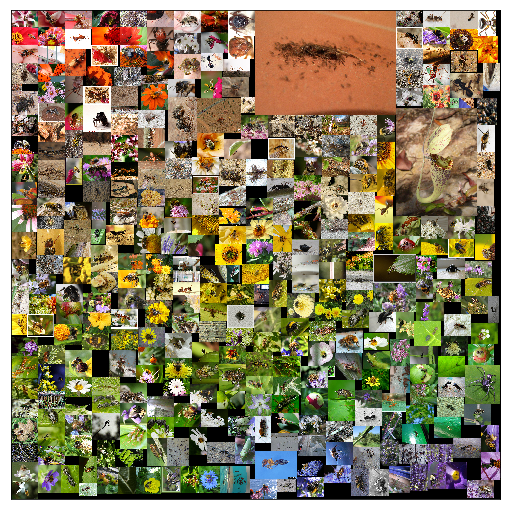

In [9]:
repack = displaybinned(repack, dims, files, figwidth=10)

#### Same Heurisic, bin size approximated to 103.5% of area: packs all rectangles

In [10]:
%%time
b = pb.Binnit(0,0)
pack = b.Pack(sizelist, verbose=True, overflow=1.035)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9339 
	Output bin width  9339
chosen method: MaxRectsBinPack, heuristic: RectBestShortSideFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 5.34 ms, sys: 237 µs, total: 5.57 ms
Wall time: 5.37 ms


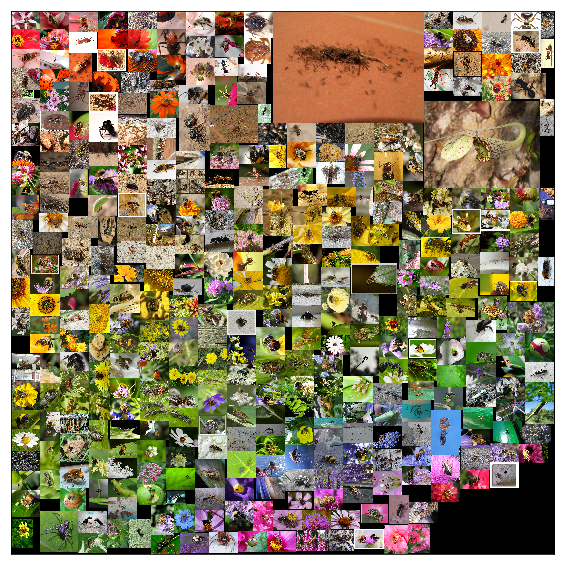

In [11]:
repack = displaybinned(repack, dims, files, figwidth=10)

#### Same Heuristic: Fixed Rectangle size, 4K nominal

In [12]:
%%time
b = pb.Binnit(2160,3940) # initialize best fit
pack = b.Pack(sizelist, heuristic=0, verbose=True, overflow=1)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  2160 
Input bin height  3940
	Use input dimensions:  True
chosen method: MaxRectsBinPack, heuristic: RectBestShortSideFit
Number of Bins:	 11
Number of Rectangles:	 397
CPU times: user 1.17 ms, sys: 178 µs, total: 1.35 ms
Wall time: 1.07 ms


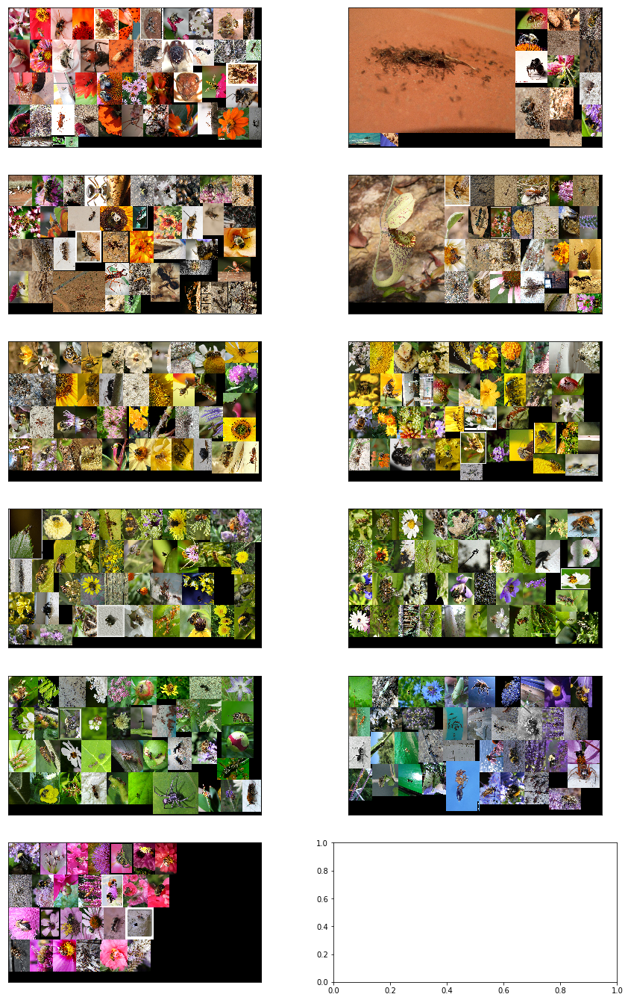

In [13]:
repack = displaybinned(repack, dims, files, figwidth=15)

In [14]:
%%time
b = pb.Binnit() # initialize best fit
pack = b.Pack(sizelist, heuristic=1, verbose=True, overflow=1.055)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9520 
	Output bin width  9520
chosen method: MaxRectsBinPack, heuristic: RectBestLongSideFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 12.4 ms, sys: 88 µs, total: 12.5 ms
Wall time: 12.2 ms


#### Show only rectangles: this will happen also if the files are not loaded
* minimum rect that fits all is a bit worse with this heuristic 105.5%

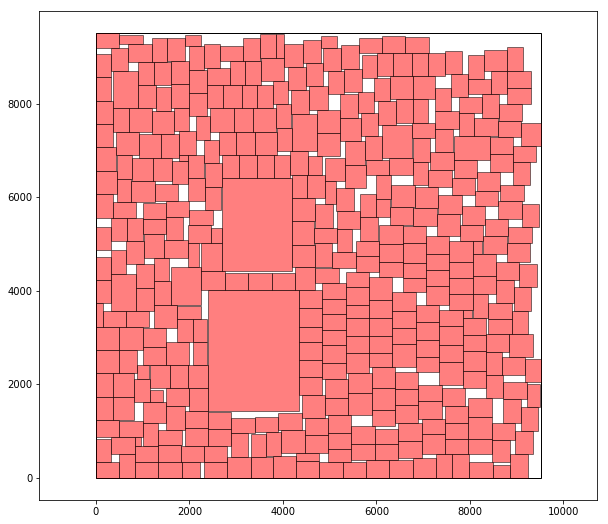

In [15]:
repack = displaybinned(repack, dims, files, figwidth=10, noimages=True)

In [16]:
%%time
b = pb.Binnit(0,0) # initialize best fit
pack = b.Pack(sizelist, heuristic=2, verbose=True, overflow=1.026)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9258 
	Output bin width  9258
chosen method: MaxRectsBinPack, heuristic: RectBestAreaFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 9.04 ms, sys: 9.04 ms, total: 18.1 ms
Wall time: 5.95 ms


#### with this heuristic 102.6% of area suffices to pack all rectangles

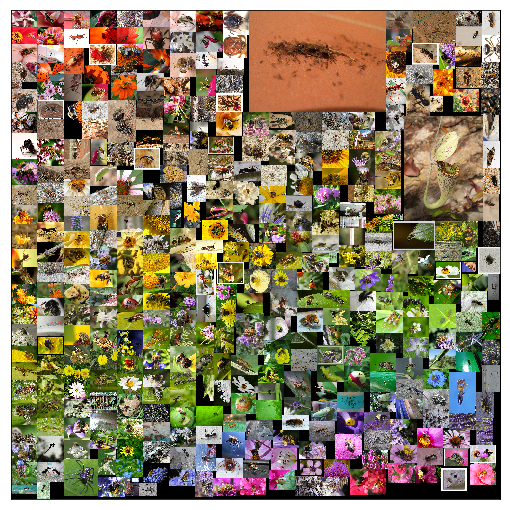

In [17]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [18]:
%%time
b = pb.Binnit(0,0) # initialize best fit
pack = b.Pack(sizelist, heuristic=3, verbose=True, overflow=1.039)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9375 
	Output bin width  9375
chosen method: MaxRectsBinPack, heuristic: RectBottomLeftRule
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 8.7 ms, sys: 131 µs, total: 8.83 ms
Wall time: 8.11 ms


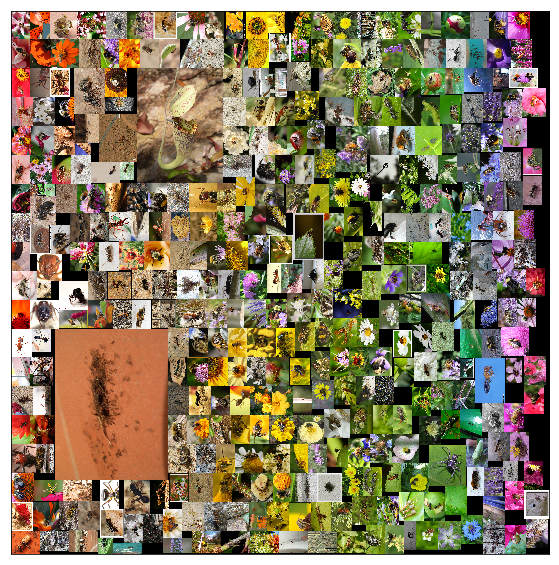

In [19]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [20]:
%%time
b = pb.Binnit(0,0) # initialize best fit
pack = b.Pack(sizelist, heuristic=4, verbose=True, overflow=1.041)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9393 
	Output bin width  9393
chosen method: MaxRectsBinPack, heuristic: RectContactPointRule
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 15.2 ms, sys: 571 µs, total: 15.8 ms
Wall time: 15.6 ms


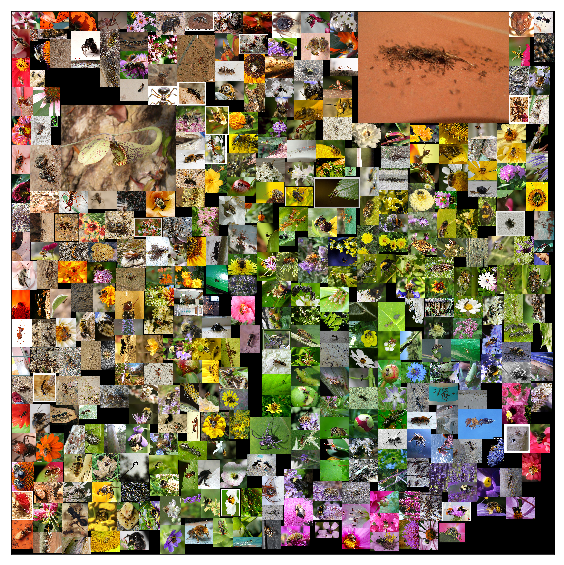

In [21]:
repack = displaybinned(repack, dims, files, figwidth=10)

### GuillotineBinPack

6 heuristics:
* RectBestAreaFit
* RectBestShortSideFit
* RectBestLongSideFit
* RectWorstAreaFit
* RectWorstShortSideFit
* RectWorstLongSideFit

6 split algorithms -  only ran the the split algoriths with the first heuristic
* SplitShorterLeftoverAxis
* SplitLongerLeftoverAxis
* SplitMinimizeArea
* SplitMaximizeArea
* SplitShorterAxis
* SplitLongerAxis

In [22]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=0, verbose=True, overflow=1.07)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9655 
	Output bin width  9655
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 4.44 ms, sys: 72 µs, total: 4.51 ms
Wall time: 4.17 ms


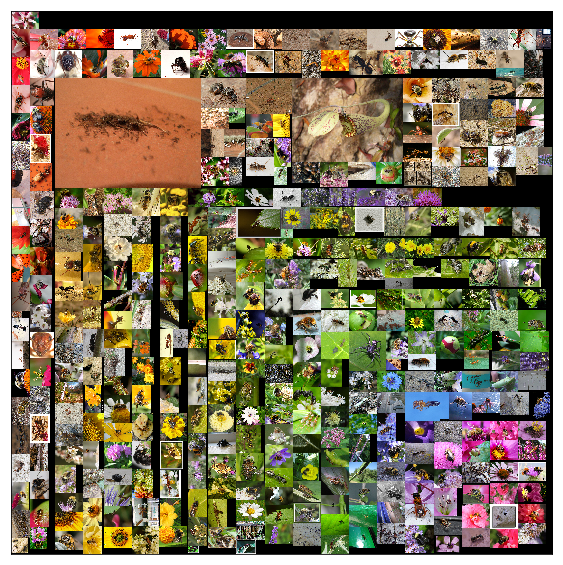

In [23]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [24]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=1, verbose=True, overflow=1.77)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  15972 
	Output bin width  15972
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitLongerLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 5.14 ms, sys: 179 µs, total: 5.32 ms
Wall time: 4.91 ms


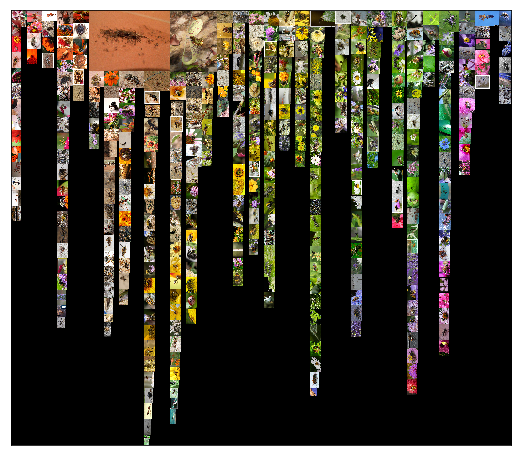

In [25]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [26]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=2, verbose=True, overflow=1.07)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9655 
	Output bin width  9655
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitMinimizeArea
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 4.42 ms, sys: 62 µs, total: 4.48 ms
Wall time: 4.21 ms


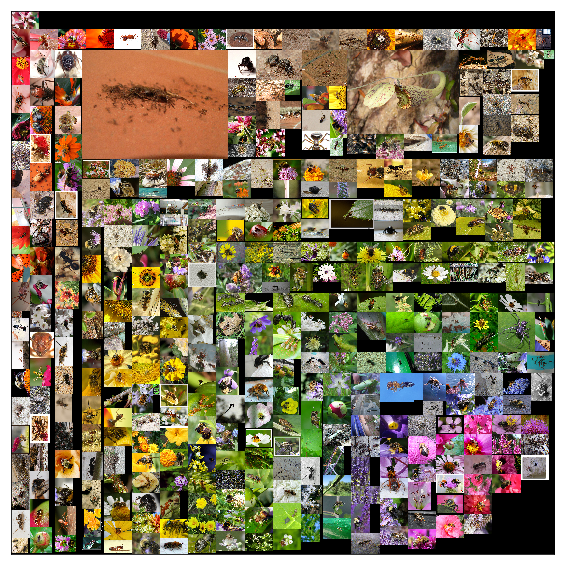

In [27]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [28]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=3, verbose=True, overflow=1.77)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  15972 
	Output bin width  15972
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitMaximizeArea
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 3.99 ms, sys: 0 ns, total: 3.99 ms
Wall time: 3.77 ms


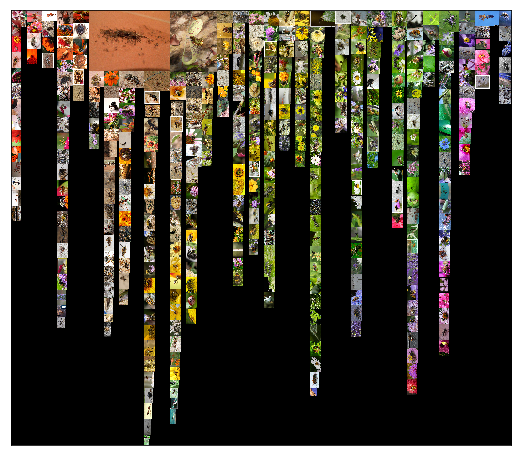

In [29]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [30]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=4, verbose=True, overflow=1.08)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9745 
	Output bin width  9745
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitShorterAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 6.63 ms, sys: 0 ns, total: 6.63 ms
Wall time: 6.08 ms


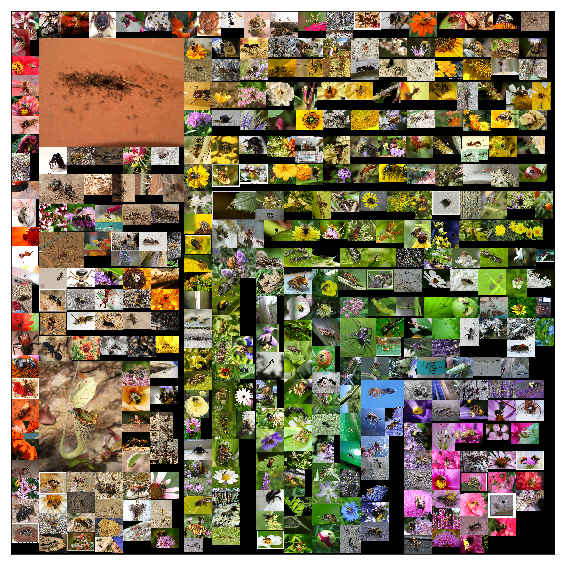

In [31]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [32]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=0, split_method=5, verbose=True, overflow=1.85)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  16694 
	Output bin width  16694
chosen method: GuillotineBinPack, heuristic: RectBestAreaFit , split method: SplitLongerAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 4.13 ms, sys: 18 µs, total: 4.15 ms
Wall time: 3.85 ms


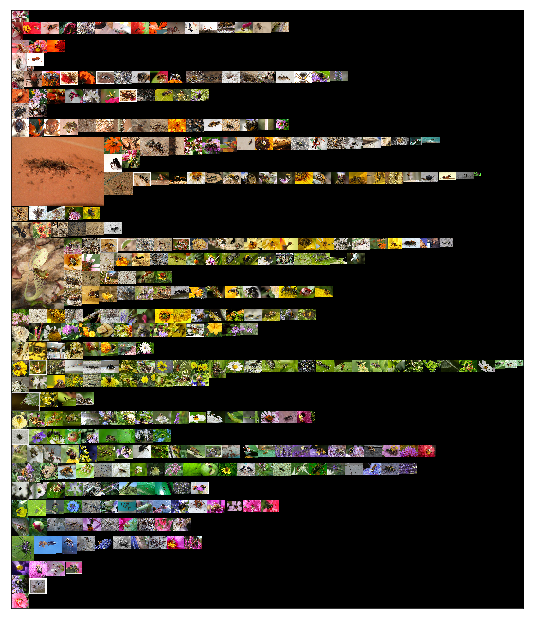

In [33]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [34]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=1, split_method=0, verbose=True, overflow=1.05)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9475 
	Output bin width  9475
chosen method: GuillotineBinPack, heuristic: RectBestShortSideFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 5.41 ms, sys: 191 µs, total: 5.6 ms
Wall time: 5.27 ms


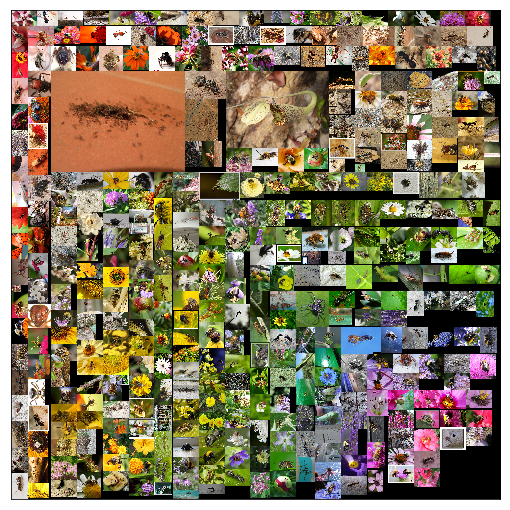

In [35]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [36]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=2, split_method=0, verbose=True, overflow=1.11)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  10016 
	Output bin width  10016
chosen method: GuillotineBinPack, heuristic: RectBestLongSideFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 4.71 ms, sys: 95 µs, total: 4.81 ms
Wall time: 4.61 ms


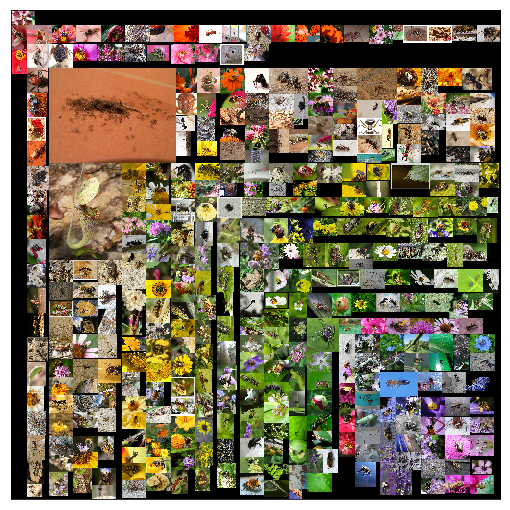

In [37]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [38]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=1, heuristic=3, split_method=0, verbose=True, overflow=1.11)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  10016 
	Output bin width  10016
chosen method: GuillotineBinPack, heuristic: RectWorstAreaFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 4.44 ms, sys: 58 µs, total: 4.5 ms
Wall time: 4.12 ms


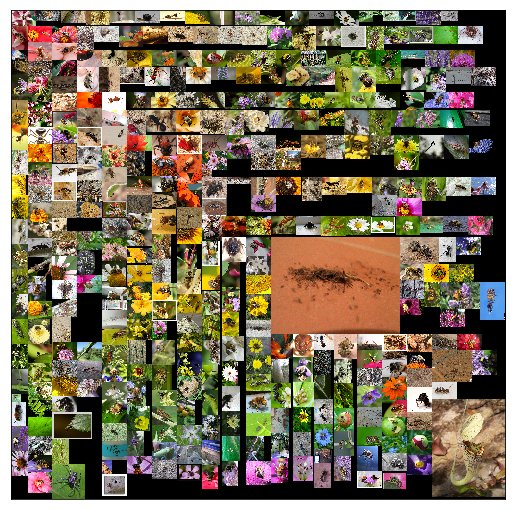

In [39]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [40]:
%%time
b = pb.Binnit() 
pack = b.Pack(sizelist, method=1, heuristic=4, split_method=0, verbose=True, overflow=2.1)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  18950 
	Output bin width  18950
chosen method: GuillotineBinPack, heuristic: RectWorstShortSideFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 6.5 ms, sys: 332 µs, total: 6.84 ms
Wall time: 6.37 ms


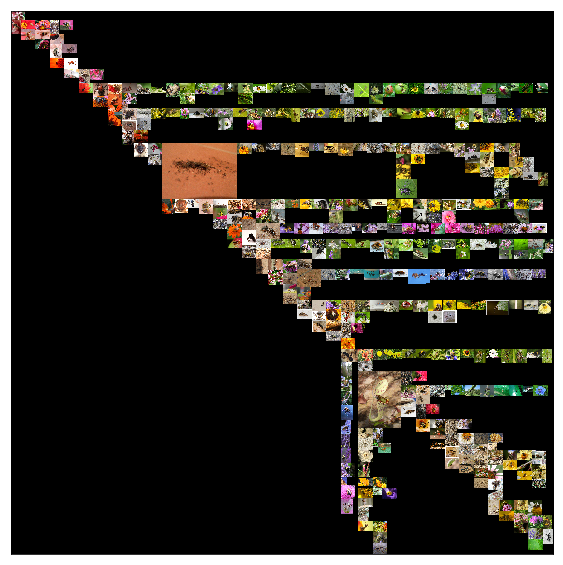

In [41]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [42]:
%%time
b = pb.Binnit() 
pack = b.Pack(sizelist, method=1, heuristic=5, split_method=0, verbose=True, overflow=1.08)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9745 
	Output bin width  9745
chosen method: GuillotineBinPack, heuristic: RectWorstLongSideFit , split method: SplitShorterLeftoverAxis
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 3.74 ms, sys: 0 ns, total: 3.74 ms
Wall time: 3.52 ms


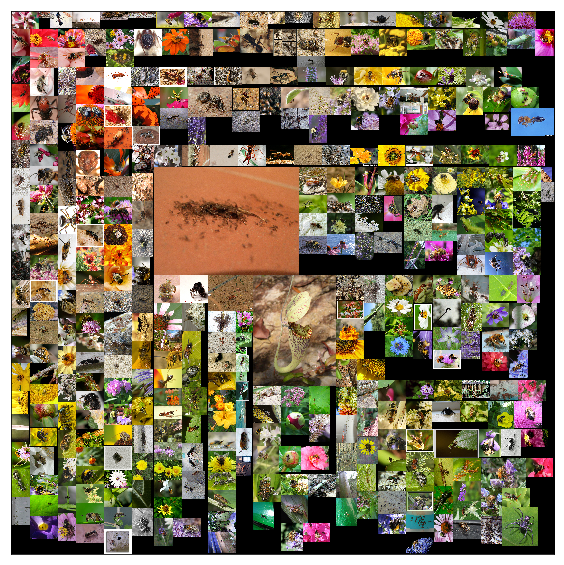

In [43]:
repack = displaybinned(repack, dims, files, figwidth=10)

### ShelfBinPack
** Errata it it does not seem that new shelves are initialized?** : all huristics look the same same, perhaps Im not doing something with the bins. 

In [44]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=2, heuristic=0, verbose=True, overflow=1.15)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  10377 
	Output bin width  10377
chosen method: ShelfBinPack, heuristic: ShelfNextFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 1.66 ms, sys: 214 µs, total: 1.88 ms
Wall time: 1.46 ms


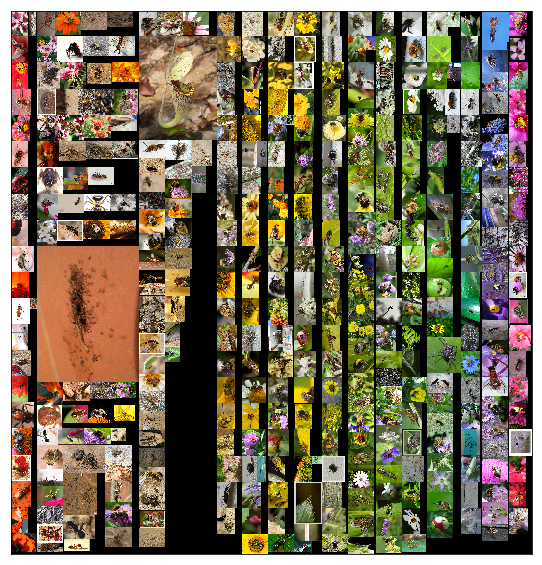

In [45]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [46]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=2, heuristic=1, verbose=True, overflow=1.15)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  10377 
	Output bin width  10377
chosen method: ShelfBinPack, heuristic: ShelfFirstFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 1.59 ms, sys: 204 µs, total: 1.8 ms
Wall time: 1.42 ms


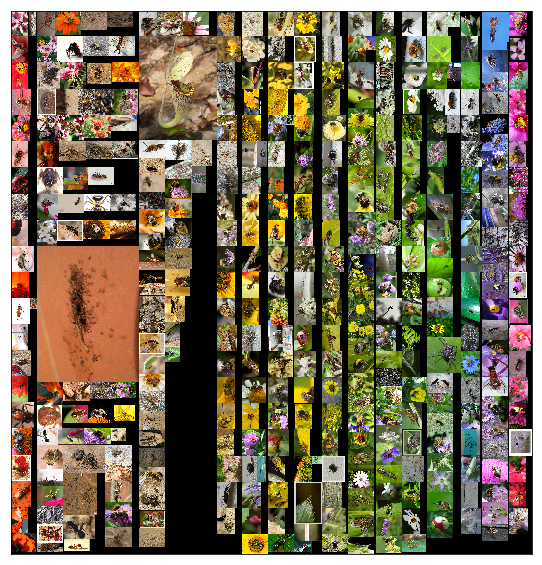

In [47]:
repack = displaybinned(repack, dims, files, figwidth=10)

### ShelfNextBinpack
* no heurisics

** does not look to efficient for datasets with wildly varying image sizes.**

In [48]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=3, verbose=True, overflow=1.25)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  11279 
	Output bin width  11279
chosen method: ShelfNextFitBinPack
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 652 µs, sys: 83 µs, total: 735 µs
Wall time: 432 µs


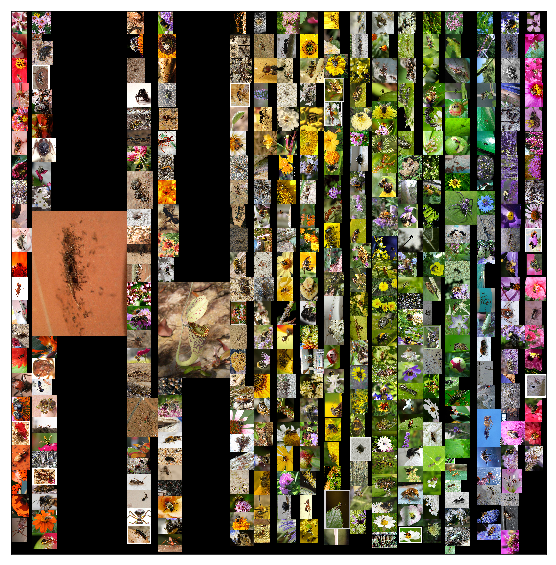

In [49]:
repack = displaybinned(repack, dims, files, figwidth=10)

### SkylineBinPack
2 heuristics
* LevelBottomLeft
* LevelMinWasteFit

In [50]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=4, heuristic=0, verbose=True, overflow=1.04)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9384 
	Output bin width  9384
chosen method: SkylineBinPack, heuristic: LevelBottomLeft
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 2.12 ms, sys: 268 µs, total: 2.38 ms
Wall time: 2.05 ms


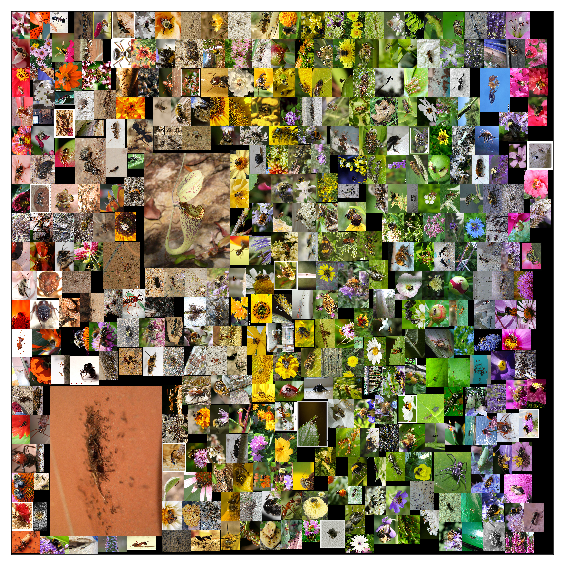

In [51]:
repack = displaybinned(repack, dims, files, figwidth=10)

In [52]:
%%time
b = pb.Binnit(0,0) # initialize best fit-
pack = b.Pack(sizelist, method=4, heuristic=1, verbose=True, overflow=1.08)
repack, dims = pack_to_canvas(pack)

::get_rectangles()
Array has  397  elements, of  2 dimensions
::approximate_bin_size()
Input bin width:  0 
Input bin height  0
	Output bin height  9745 
	Output bin width  9745
chosen method: SkylineBinPack, heuristic: LevelMinWasteFit
Number of Bins:	 1
Number of Rectangles:	 397
CPU times: user 1.36 ms, sys: 0 ns, total: 1.36 ms
Wall time: 1.16 ms


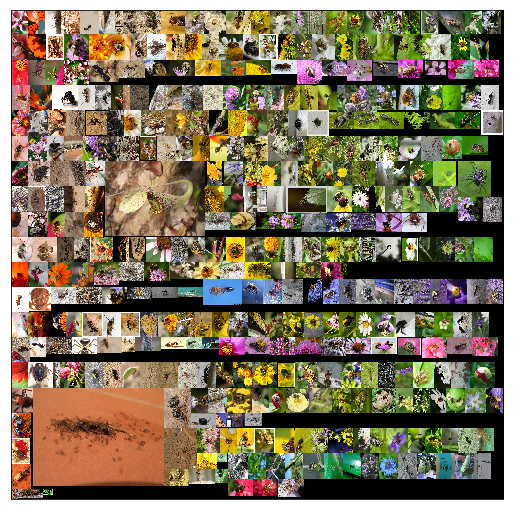

In [53]:
repack = displaybinned(repack, dims, files, figwidth=10)